#1. Hough Transform

##Part 1: Lane Detection using Hough Line Transform

Cell 1 – Upload ZIP File

In [1]:
from google.colab import files
uploaded = files.upload()  # Upload "Hough Transform.zip"


Saving Hough Transform.zip to Hough Transform.zip


Cell 2 – Extract ZIP and Locate Subfolders

In [2]:
import zipfile, os

zip_path = list(uploaded.keys())[0]
extract_root = "/content/hough_data"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_root)

# Get Part 1 and Part 2 folder paths
part1_path = os.path.join(extract_root, "Hough Transform Part 1")
part2_path = os.path.join(extract_root, "Hough Transform Part 2")

print(" ZIP extracted successfully.")
print(f" Part 1 folder: {part1_path}")
print(f" Part 2 folder: {part2_path}")


 ZIP extracted successfully.
 Part 1 folder: /content/hough_data/Hough Transform Part 1
 Part 2 folder: /content/hough_data/Hough Transform Part 2


Cell 3 – Display all images from Part 1

 Showing 23 images from Part 1...


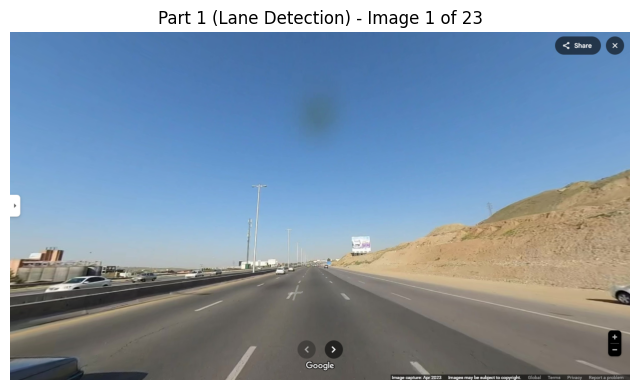

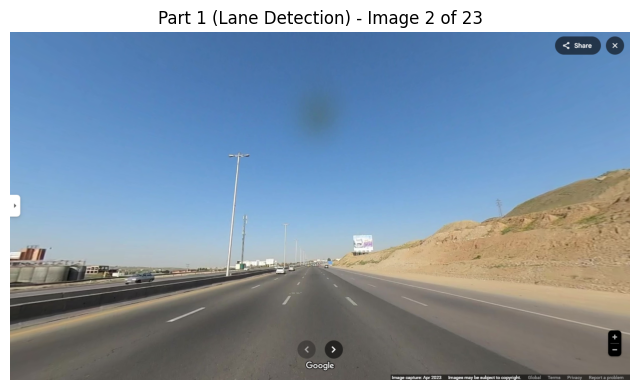

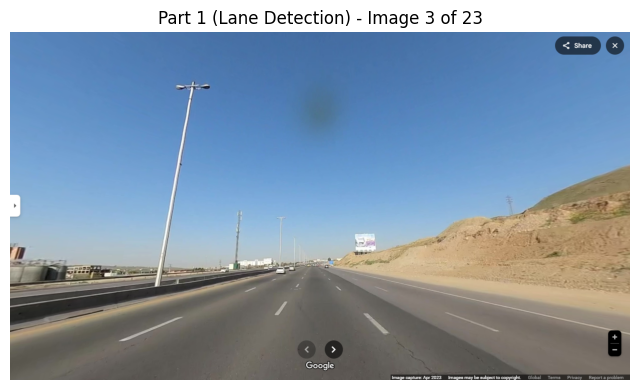

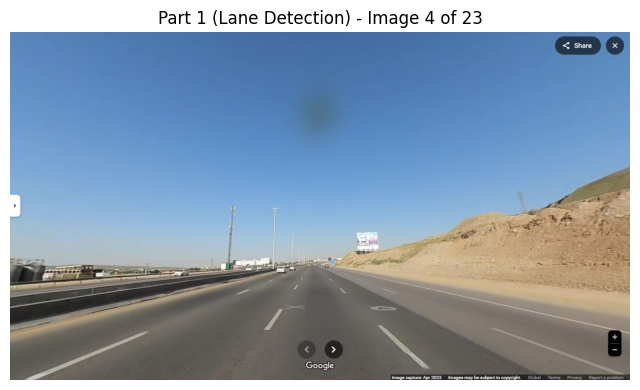

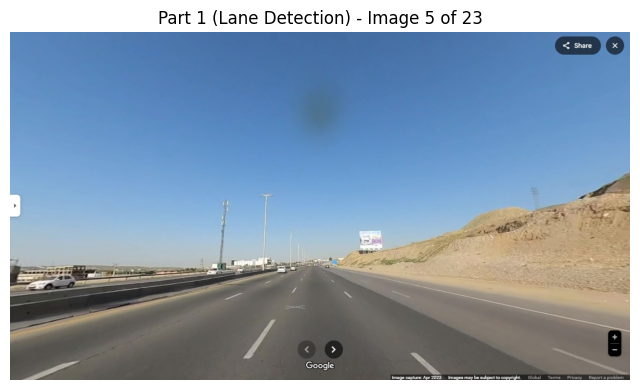

...

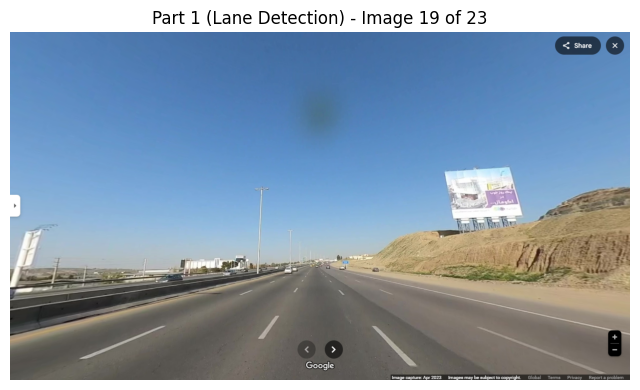

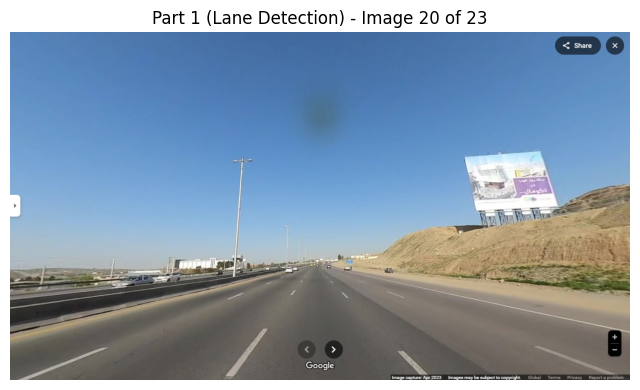

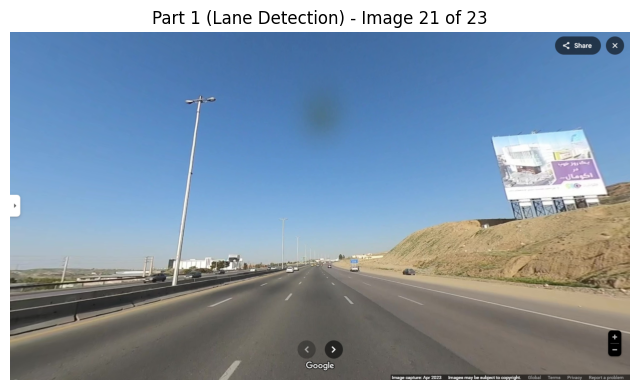

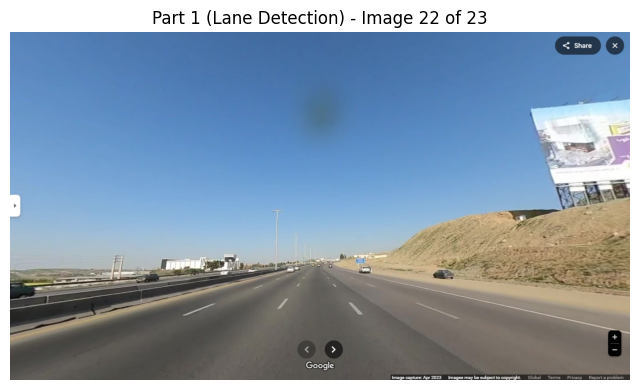

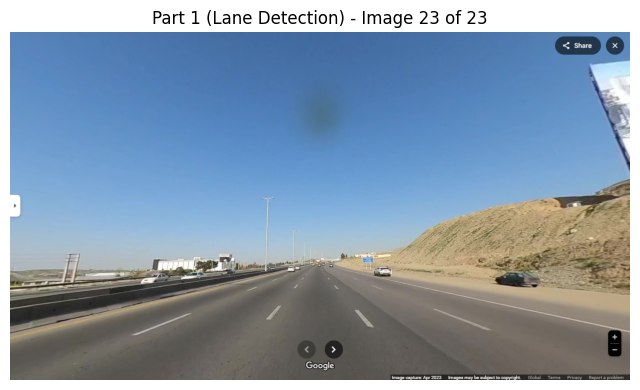

In [4]:
import cv2
import matplotlib.pyplot as plt

# Define image extension formats
image_extensions = ('.jpg', '.jpeg', '.png')

# Reload image files in case you run this cell standalone
image_files_part1 = sorted([
    os.path.join(part1_path, f)
    for f in os.listdir(part1_path)
    if f.lower().endswith(image_extensions)
])


def show_all_images(image_files, title):
    for idx, img_path in enumerate(image_files):
        img = cv2.imread(img_path)
        plt.figure(figsize=(8, 6))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{title} - Image {idx + 1} of {len(image_files)}")
        plt.axis("off")
        plt.show()

# Show all images for Part 1
print(f" Showing {len(image_files_part1)} images from Part 1...")
show_all_images(image_files_part1, "Part 1 (Lane Detection)")



Cell 4 – Define Region of Interest (ROI)

In [5]:
import numpy as np
import cv2

def dynamic_roi(img):
    height, width = img.shape[:2]

    polygon = np.array([[
        (int(0.2 * width), height),
        (int(0.45 * width), int(0.6 * height)),
        (int(0.55 * width), int(0.6 * height)),
        (int(0.8 * width), height),
    ]], dtype=np.int32)

    mask = np.zeros_like(img)
    cv2.fillPoly(mask, polygon, 255)

    return cv2.bitwise_and(img, mask)

Cell 5 -

In [6]:
def extract_line_groups(lines):
    left, right = [], []
    for line in lines:
        x1, y1, x2, y2 = line[0]
        if x2 - x1 == 0:
            continue
        slope = (y2 - y1) / (x2 - x1)
        if abs(slope) < 0.3:  # Ignore nearly horizontal lines
            continue
        intercept = y1 - slope * x1
        # Improved separation: slope < -0.3 = left, > 0.3 = right
        if slope < -0.3:
            left.append((slope, intercept))
        elif slope > 0.3:
            right.append((slope, intercept))
    return left, right


# Compute reference lines from first image
img_base = cv2.imread(image_files_part1[0])
gray_base = cv2.cvtColor(img_base, cv2.COLOR_BGR2GRAY)
blur_base = cv2.GaussianBlur(gray_base, (5, 5), 0)
edges_base = cv2.Canny(blur_base, 50, 150)
roi_base = dynamic_roi(edges_base)
lines_base = cv2.HoughLinesP(roi_base, 1, np.pi / 180, threshold=40, minLineLength=80, maxLineGap=120)

left_ref, right_ref = extract_line_groups(lines_base)
reference_left = np.mean(left_ref, axis=0) if left_ref else None
reference_right = np.mean(right_ref, axis=0) if right_ref else None



Cell 6 – Line Filtering and Averaging by Slope

In [7]:
def average_slope_intercept(lines, width, height):
    global reference_left, reference_right

    left, right = [], []

    for line in lines:
        x1, y1, x2, y2 = line[0]
        if x2 - x1 == 0:
            continue
        slope = (y2 - y1) / (x2 - x1)
        if abs(slope) < 0.7:
            continue
        intercept = y1 - slope * x1
        if slope < 0:
            left.append((slope, intercept))
        else:
            right.append((slope, intercept))

    final_lines = []

    def get_line_points(slope, intercept):
        y1 = int(height * 1.0)
        y2 = int(height * 0.73)
        x1 = int((y1 - intercept) / slope)
        x2 = int((y2 - intercept) / slope)
        return (x1, y1, x2, y2)

    # Left line
    if left:
        avg_left = np.mean(left, axis=0)
    elif reference_left is not None:
        avg_left = reference_left
    else:
        avg_left = None

    if avg_left is not None:
        final_lines.append(get_line_points(*avg_left))
    else:
        final_lines.append(None)  # important for position tracking

    # Right line
    if right:
        avg_right = np.mean(right, axis=0)
    elif reference_right is not None:
        avg_right = reference_right
    else:
        avg_right = None

    if avg_right is not None:
        final_lines.append(get_line_points(*avg_right))
    else:
        final_lines.append(None)
        # Ensure left line is actually on the left

    if final_lines[0] and final_lines[1]:
        lx1, _, _, _ = final_lines[0]
        rx1, _, _, _ = final_lines[1]
        if lx1 > rx1:
            # Swap if left is actually on the right
            final_lines[0], final_lines[1] = final_lines[1], final_lines[0]


    return final_lines  # [left_line, right_line]


Cell 7 – Full Lane Detection (Canny + Sobel + Otsu)

In [8]:
def detect_lanes(image):
    height, width = image.shape[:2]

    # Convert to grayscale and apply contrast enhancement
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    enhanced = cv2.convertScaleAbs(gray, alpha=1.3, beta=30)
    blur = cv2.GaussianBlur(enhanced, (5, 5), 0)

    # Canny edge detection
    edges_canny = cv2.Canny(blur, 50, 150)

    # Sobel gradient magnitude + Otsu thresholding
    sobelx = cv2.Sobel(blur, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(blur, cv2.CV_64F, 0, 1, ksize=3)
    sobel_mag = cv2.magnitude(sobelx, sobely)
    sobel_mag = np.uint8(sobel_mag)
    _, sobel_otsu = cv2.threshold(sobel_mag, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Combine both edge maps using logical AND (intersection)
    combined_edges = cv2.bitwise_and(edges_canny, sobel_otsu)

    # Apply region of interest mask
    roi = dynamic_roi(combined_edges)

    # Detect lines using Probabilistic Hough Transform
    lines = cv2.HoughLinesP(roi, 1, np.pi / 180, threshold=50, minLineLength=60, maxLineGap=120)

    result = image.copy()
    if lines is not None:
      final_lines = average_slope_intercept(lines, width, height)

      left_line, right_line = final_lines

      if left_line and right_line:
          (lx1, ly1, lx2, ly2) = left_line
          (rx1, ry1, rx2, ry2) = right_line

          # Fill polygon between lines
          lane_area = np.array([[(lx1, ly1), (lx2, ly2), (rx2, ry2), (rx1, ry1)]], dtype=np.int32)
          overlay = result.copy()
          cv2.fillPoly(overlay, lane_area, color=(0, 255, 0))
          result = cv2.addWeighted(overlay, 0.3, result, 0.5, 0)

          # Draw left and right lines
          cv2.line(result, (lx1, ly1), (lx2, ly2), (0, 255, 0), 8)
          cv2.line(result, (rx1, ry1), (rx2, ry2), (0, 255, 0), 8)

      else:
          # draw only available lines
          for line in final_lines:
              if line:
                  x1, y1, x2, y2 = line
                  cv2.line(result, (x1, y1), (x2, y2), (0, 255, 0), 8)

    return result, edges_canny, sobel_otsu, roi, combined_edges

Cell 8 – Run Detection on One Image

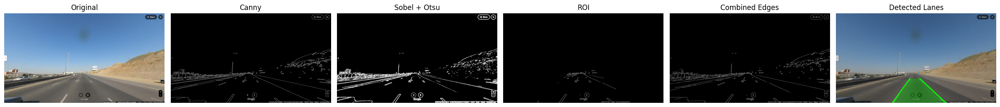

In [9]:
sample_img = cv2.imread(image_files_part1[0])
result_img, edges_img, sobel_img, roi_img, combined_edges = detect_lanes(sample_img)

plt.figure(figsize=(24, 6))
titles = ["Original", "Canny", "Sobel + Otsu", "ROI", "Combined Edges", "Detected Lanes"]
images = [sample_img, edges_img, sobel_img, roi_img, combined_edges, result_img]

for i, (title, img) in enumerate(zip(titles, images)):
    plt.subplot(1, 6, i+1)
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
plt.tight_layout()
plt.show()

Cell 9 - Display all 23 images from Part 1 with full pipeline

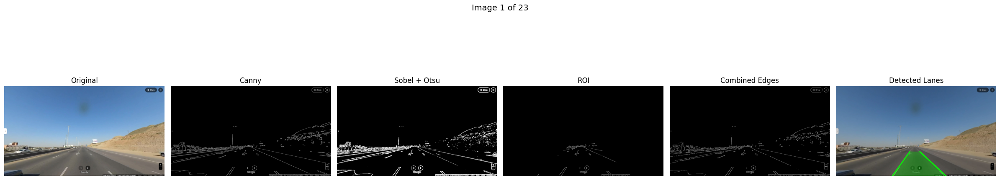

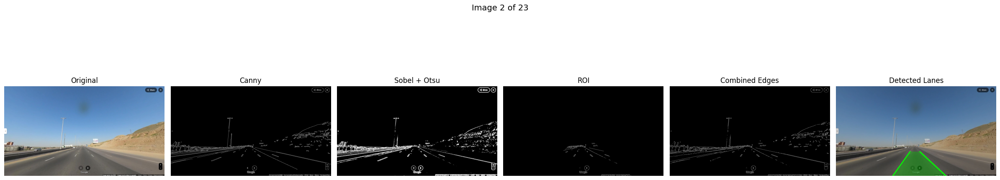

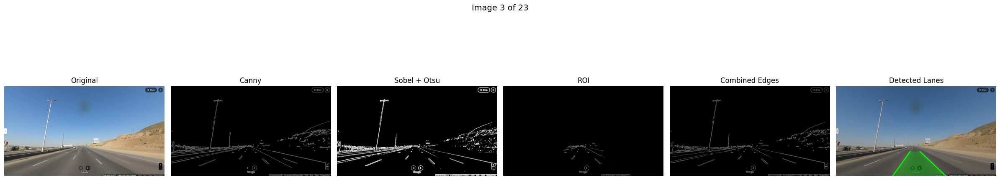

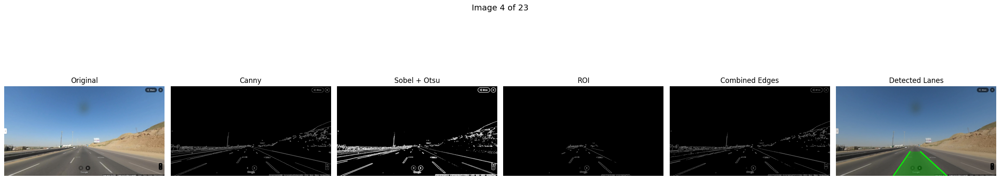

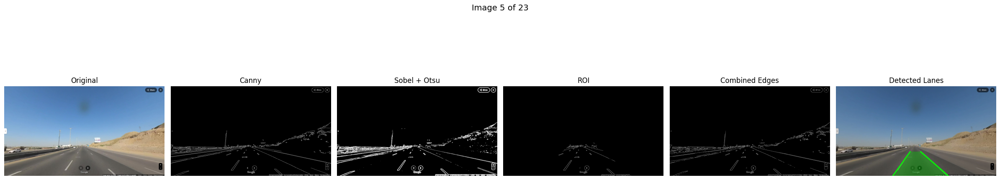

...

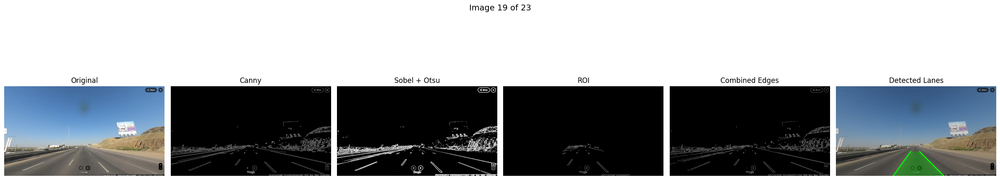

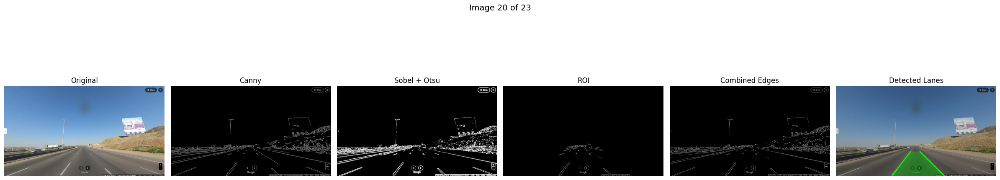

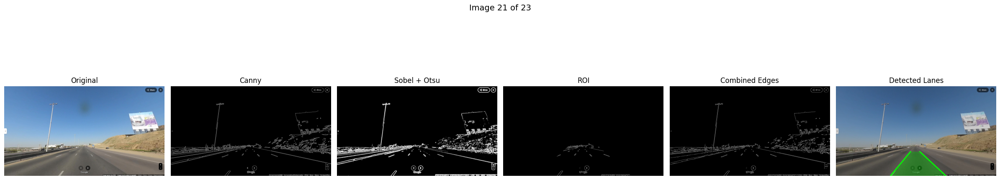

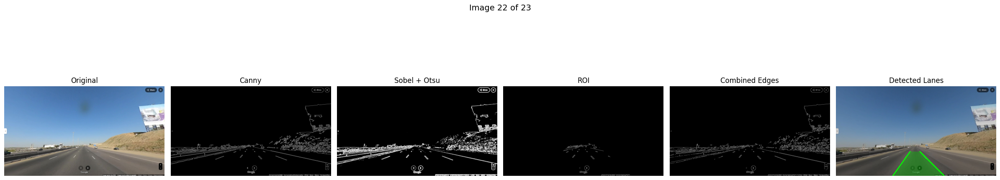

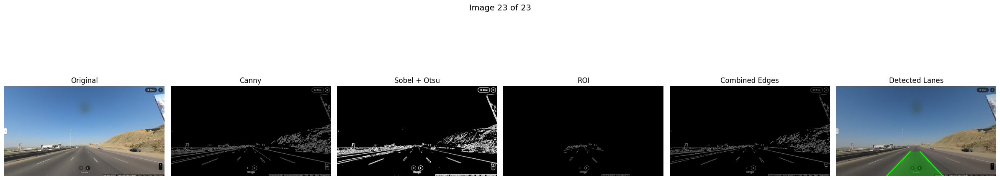

In [10]:
for idx, path in enumerate(image_files_part1):
    img = cv2.imread(path)
    result_img, edges_img, sobel_img, roi_img, combined_edges = detect_lanes(img)

    plt.figure(figsize=(24, 6))
    plt.suptitle(f"Image {idx+1} of {len(image_files_part1)}", fontsize=14)

    plt.subplot(1, 6, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 6, 2)
    plt.imshow(edges_img, cmap='gray')
    plt.title("Canny")
    plt.axis("off")

    plt.subplot(1, 6, 3)
    plt.imshow(sobel_img, cmap='gray')
    plt.title("Sobel + Otsu")
    plt.axis("off")

    plt.subplot(1, 6, 4)
    plt.imshow(roi_img, cmap='gray')
    plt.title("ROI")
    plt.axis("off")

    plt.subplot(1, 6, 5)
    plt.imshow(combined_edges, cmap='gray')
    plt.title("Combined Edges")
    plt.axis("off")

    plt.subplot(1, 6, 6)
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title("Detected Lanes")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Cell 10 - Create GIF

In [15]:
import os
import cv2
import imageio
import glob

# Make sure the output directory exists
os.makedirs('results', exist_ok=True)


for path in sorted(image_files_part1):  # sorted for alphabetic order
    filename = os.path.basename(path)
    img = cv2.imread(path)
    result_img, _, _, _, _ = detect_lanes(img)
    save_path = os.path.join('results', filename)
    cv2.imwrite(save_path, result_img)

# Create an animated GIF from the processed images
# The filenames like result_01.png, result_02.png, ... will be sorted correctly
image_files = sorted([
    f for ext in ('*.jpg', '*.jpeg', '*.png')
    for f in glob.glob(f'results/{ext}')
])
frames = [imageio.imread(img) for img in image_files]
imageio.mimsave('lane_detection.gif', frames, duration=10)


<ipython-input-15-edf48a4c4a3e>:23: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(img) for img in image_files]


Cell 11 - Print angles of detected lines for analysis (Part 1)

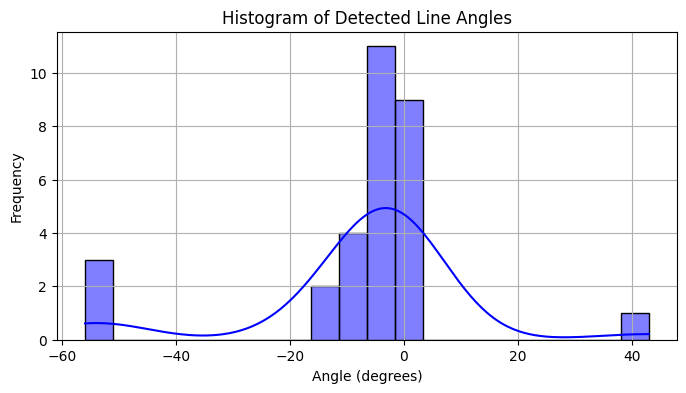

 30 lines detected.
 Mean angle: -7.30°, Std Dev: 18.20°
Line angles (in degrees):
  Line 1: 0.00°
  Line 2: 0.00°
  Line 3: -53.13°
  Line 4: 0.00°
  Line 5: -55.95°
  Line 6: -10.97°
  Line 7: -3.91°
  Line 8: -14.87°
  Line 9: 0.00°
  Line 10: 0.00°
  Line 11: -2.96°
  Line 12: -2.92°
  Line 13: -2.97°
  Line 14: -52.99°
  Line 15: -1.89°
  Line 16: -9.96°
  Line 17: 0.00°
  Line 18: 43.00°
  Line 19: -8.96°
  Line 20: 0.00°
  Line 21: 0.00°
  Line 22: -2.86°
  Line 23: -2.86°
  Line 24: -10.02°
  Line 25: -14.88°
  Line 26: 0.00°
  Line 27: -2.08°
  Line 28: -2.90°
  Line 29: -3.00°
  Line 30: -2.04°


In [16]:
import math
import seaborn as sns

def analyze_line_angles(image):
    height, width = image.shape[:2]
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 50, 150)
    roi = dynamic_roi(edges)

    lines = cv2.HoughLinesP(roi, 1, np.pi / 180, threshold=30, minLineLength=60, maxLineGap=120)

    if lines is None:
        print("No lines detected.")
        return

    angles = []
    for line in lines:
        x1, y1, x2, y2 = line[0]
        angle = math.degrees(math.atan2(y2 - y1, x2 - x1))
        angles.append(angle)

    # Plot histogram using seaborn
    plt.figure(figsize=(8, 4))
    sns.histplot(angles, bins=20, kde=True, color='blue')
    plt.title("Histogram of Detected Line Angles")
    plt.xlabel("Angle (degrees)")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

    print(f" {len(angles)} lines detected.")
    print(f" Mean angle: {np.mean(angles):.2f}°, Std Dev: {np.std(angles):.2f}°")

    print("Line angles (in degrees):")
    for i, angle in enumerate(angles):
        print(f"  Line {i+1}: {angle:.2f}°")

# Run analysis on a specific image (first image as example)
analyze_line_angles(cv2.imread(image_files_part1[0]))


##Part 2:

Cell 12 - Load and Display Part 2 Images

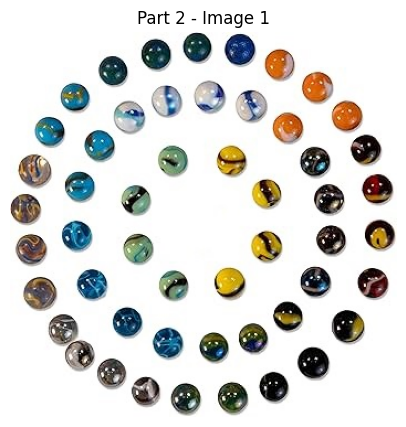

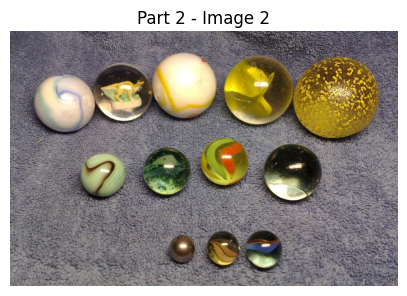

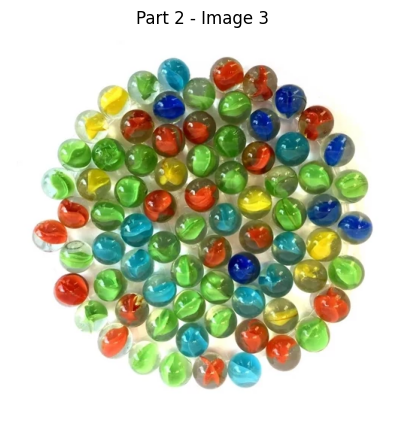

In [17]:
import cv2
import matplotlib.pyplot as plt
import os

image_files_part2 = sorted([
    os.path.join(part2_path, f)
    for f in os.listdir(part2_path)
    if f.lower().endswith(image_extensions)
])

# Load image paths from Part 2 folder
image_extensions = ('.jpg', '.jpeg', '.png')
image_files_part2 = sorted([
    os.path.join(part2_path, f)
    for f in os.listdir(part2_path)
    if f.lower().endswith(image_extensions)
])

# Load all images
images_part2 = [cv2.imread(path) for path in image_files_part2]

# Display images
for idx, img in enumerate(images_part2):
    plt.figure(figsize=(5, 5))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Part 2 - Image {idx+1}")
    plt.axis("off")
    plt.show()


Cell 13 – Circle Detection on Image 1

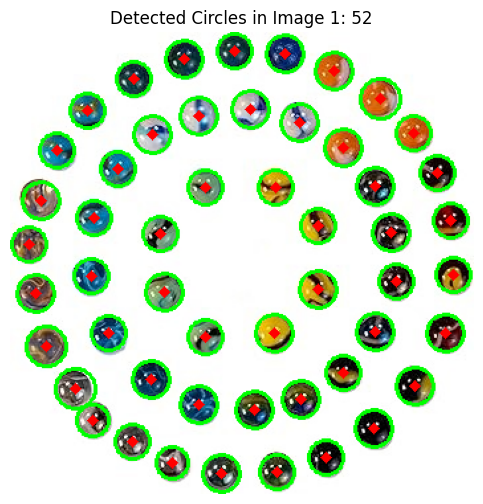

In [18]:
import numpy as np

def detect_circles_image1(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.medianBlur(gray, 5)

    # HoughCircles with tuned parameters for image 1
    circles = cv2.HoughCircles(blur,
                            cv2.HOUGH_GRADIENT,
                            dp=1.2,
                            minDist=18,
                            param1=100,
                            param2=25,
                            minRadius=8,
                            maxRadius=35)


    output = img.copy()
    count = 0
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for (x, y, r) in circles[0, :]:
            cv2.circle(output, (x, y), r, (0, 255, 0), 2)
            cv2.circle(output, (x, y), 2, (0, 0, 255), 3)
        count = len(circles[0])

    return output, count

# Run detection on first image from Part 2
img1_result, img1_count = detect_circles_image1(images_part2[0])

# Show result
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(img1_result, cv2.COLOR_BGR2RGB))
plt.title(f"Detected Circles in Image 1: {img1_count}")
plt.axis("off")
plt.show()


Cell 14 – Circle Detection on Image 3

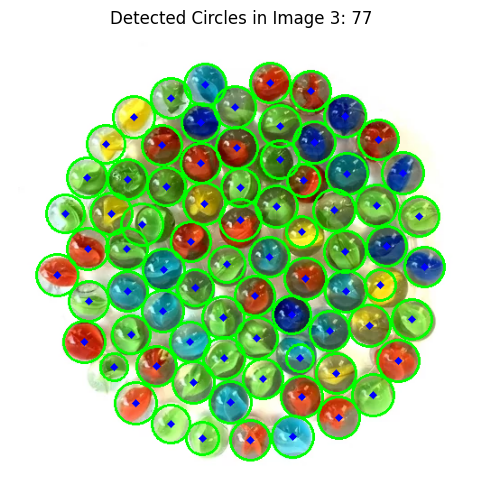

In [19]:
import numpy as np

def detect_circles_image3(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (7, 7), sigmaX=1.2)

    circles = cv2.HoughCircles(blurred,
                               cv2.HOUGH_GRADIENT,
                               dp=1.1,
                               minDist=10,
                               param1=100,
                               param2=20,
                               minRadius=9,
                               maxRadius=24)

    output = img.copy()
    final_circles = []
    count = 0

    if circles is not None:
        # Convert to int32 to avoid overflow in distance calculations
        circles = np.int32(np.around(circles[0]))
        # Sort by radius (largest first)
        circles = sorted(circles, key=lambda c: c[2], reverse=True)

        for (x1, y1, r1) in circles:
            keep = True
            for (x2, y2, r2) in final_circles:
                dist = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                if dist < max(r1, r2) * 1.2:
                    keep = False
                    break
            if keep:
                final_circles.append((x1, y1, r1))

        for (x, y, r) in final_circles:
            cv2.circle(output, (x, y), r, (0, 255, 0), 2)
            cv2.circle(output, (x, y), 2, (255, 0, 0), 3)

        count = len(final_circles)

    return output, count
# Run detection on third image from Part 2
img3_result, img3_count = detect_circles_image3(images_part2[2])

# Show result
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(img3_result, cv2.COLOR_BGR2RGB))
plt.title(f"Detected Circles in Image 3: {img3_count}")
plt.axis("off")
plt.show()
